In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder,MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, root_mean_squared_error

from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import plot_model 

import shap

from warnings import filterwarnings
filterwarnings('ignore')

2025-02-14 20:19:37.101131: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


# Data Acquisition

1. Read the CSV file that contains the entire Dataset.
2. Split the Data based on the nature of features.
    * Socio-Economic Factors.
    * Healthcare Access and Spending
    * Lifestyle and Environmental factors.
    * Mortality and Disease Factors.
3. Spliting The Dataset based on the type of features.
    * Numerical.
    * Categorical.

In [2]:
df = pd.read_csv('Data/Life Expectancy Data.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [4]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,2938.0,2.007519e+03,4.613841e+00,2000.00000,2004.000000,2.008000e+03,2.012000e+03,2.015000e+03
Life expectancy,2928.0,6.922493e+01,9.523867e+00,36.30000,63.100000,7.210000e+01,7.570000e+01,8.900000e+01
Adult Mortality,2928.0,1.647964e+02,1.242921e+02,1.00000,74.000000,1.440000e+02,2.280000e+02,7.230000e+02
infant deaths,2938.0,3.030395e+01,1.179265e+02,0.00000,0.000000,3.000000e+00,2.200000e+01,1.800000e+03
Alcohol,2744.0,4.602861e+00,4.052413e+00,0.01000,0.877500,3.755000e+00,7.702500e+00,1.787000e+01
percentage expenditure,2938.0,7.382513e+02,1.987915e+03,0.00000,4.685343,6.491291e+01,4.415341e+02,1.947991e+04
Hepatitis B,2385.0,8.094046e+01,2.507002e+01,1.00000,77.000000,9.200000e+01,9.700000e+01,9.900000e+01
Measles,2938.0,2.419592e+03,1.146727e+04,0.00000,0.000000,1.700000e+01,3.602500e+02,2.121830e+05
BMI,2904.0,3.832125e+01,2.004403e+01,1.00000,19.300000,4.350000e+01,5.620000e+01,8.730000e+01
under-five deaths,2938.0,4.203574e+01,1.604455e+02,0.00000,0.000000,4.000000e+00,2.800000e+01,2.500000e+03


In [5]:
num_cols = df.select_dtypes(include=['float64','int64']).columns
categ_cols = df.select_dtypes(include = ['object']).columns

df_socio_economic = df[
    ['Country', 'Year', 'Status', 'GDP', 'Income composition of resources', 'Schooling', 'Life expectancy ']
]

df_health_care_access = df[
    ['percentage expenditure','Hepatitis B','Polio','Diphtheria ', 'Life expectancy ']
]

df_life_style = df[
    ['Alcohol',' BMI ',' thinness  1-19 years',' thinness 5-9 years','Life expectancy ']
]

df_mortality_disease = df[
    ['Adult Mortality','infant deaths','Measles ','under-five deaths ',' HIV/AIDS','Life expectancy ']
]
dataframes = [df_socio_economic, df_health_care_access, df_life_style, df_mortality_disease]

# __Data Cleaning and Exploration__

## Cleaning missing values

In [6]:
df.isnull().sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
 BMI                                34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
 HIV/AIDS                            0
GDP                                448
Population                         652
 thinness  1-19 years               34
 thinness 5-9 years                 34
Income composition of resources    167
Schooling                          163
dtype: int64

In [7]:
features_with_missing_values = ['Life expectancy ','Adult Mortality','Alcohol','percentage expenditure','Hepatitis B',
                                ' BMI ','Polio','Total expenditure','Diphtheria ','GDP','Population',' thinness  1-19 years',
                                ' thinness 5-9 years','Income composition of resources','Schooling']

In [8]:
features_with_missing_values = ['Life expectancy ','Adult Mortality','Alcohol','percentage expenditure','Hepatitis B',
                                ' BMI ','Polio','Total expenditure','Diphtheria ','GDP','Population',' thinness  1-19 years',
                                ' thinness 5-9 years','Income composition of resources','Schooling']


imputer=SimpleImputer(missing_values=np.nan,strategy='mean')

for col in features_with_missing_values:
    df[col] = imputer.fit_transform(df[[col]])

In [9]:
df.isnull().sum()

Country                            0
Year                               0
Status                             0
Life expectancy                    0
Adult Mortality                    0
infant deaths                      0
Alcohol                            0
percentage expenditure             0
Hepatitis B                        0
Measles                            0
 BMI                               0
under-five deaths                  0
Polio                              0
Total expenditure                  0
Diphtheria                         0
 HIV/AIDS                          0
GDP                                0
Population                         0
 thinness  1-19 years              0
 thinness 5-9 years                0
Income composition of resources    0
Schooling                          0
dtype: int64

## Cleaning outliers

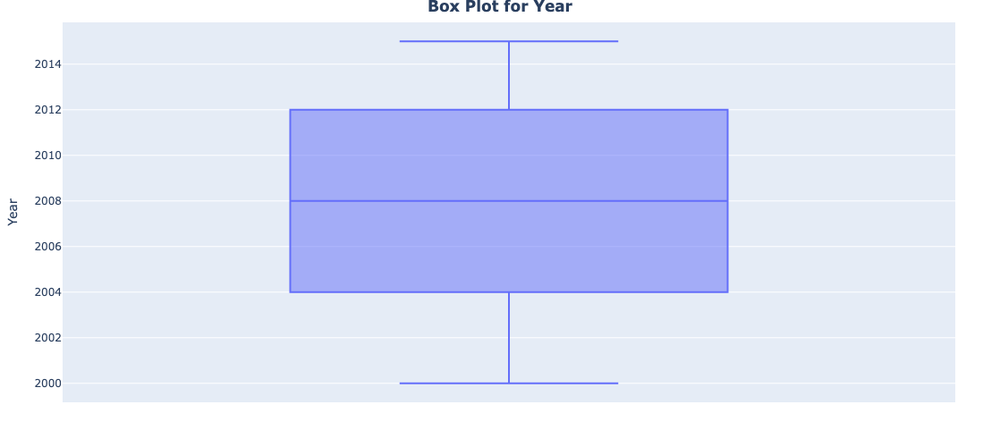

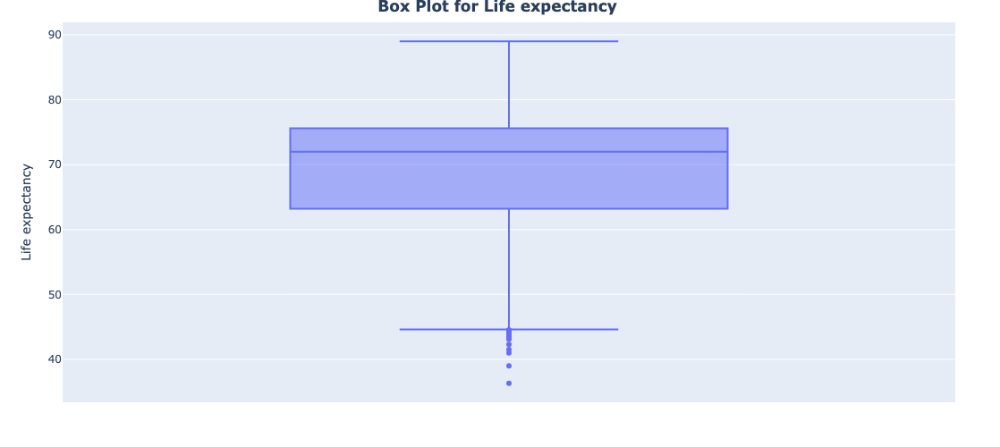

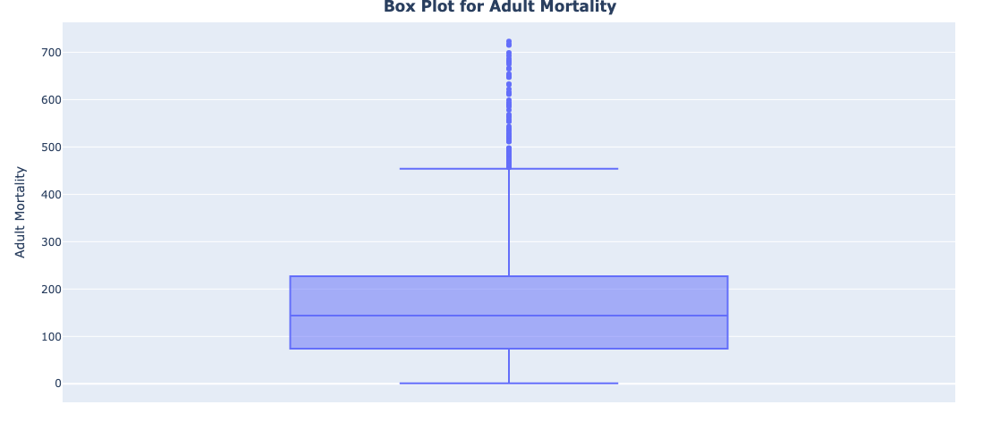

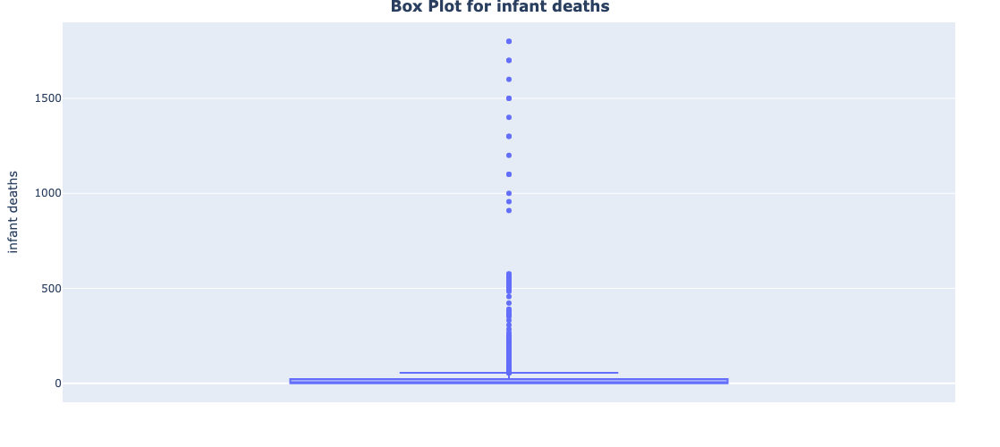

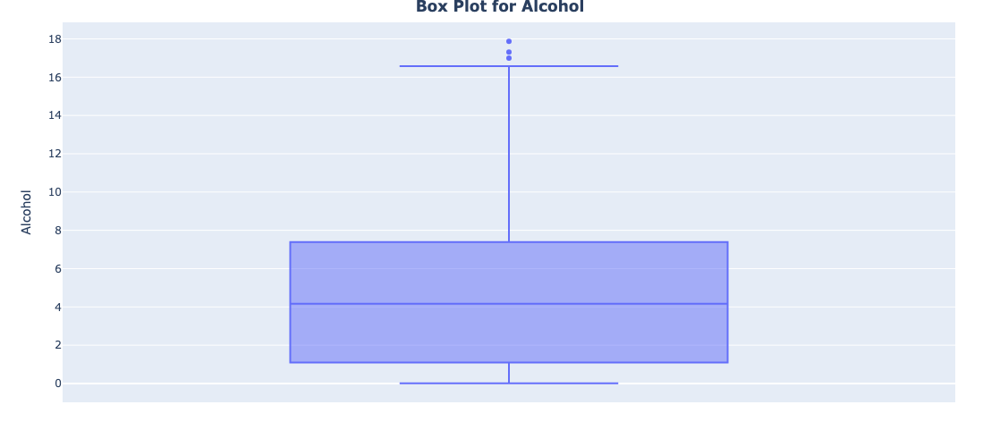

...

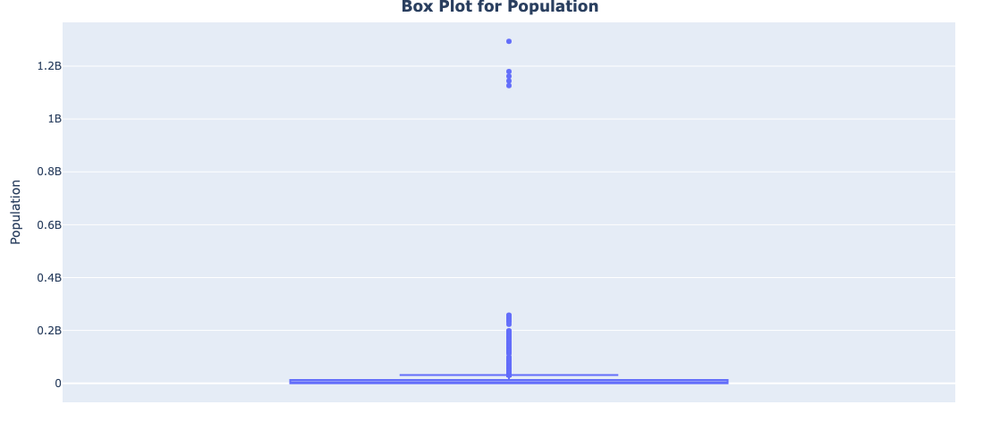

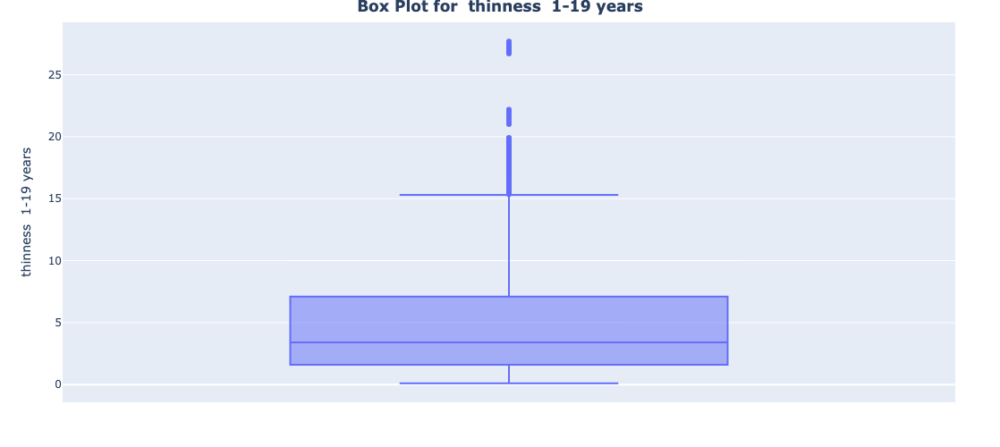

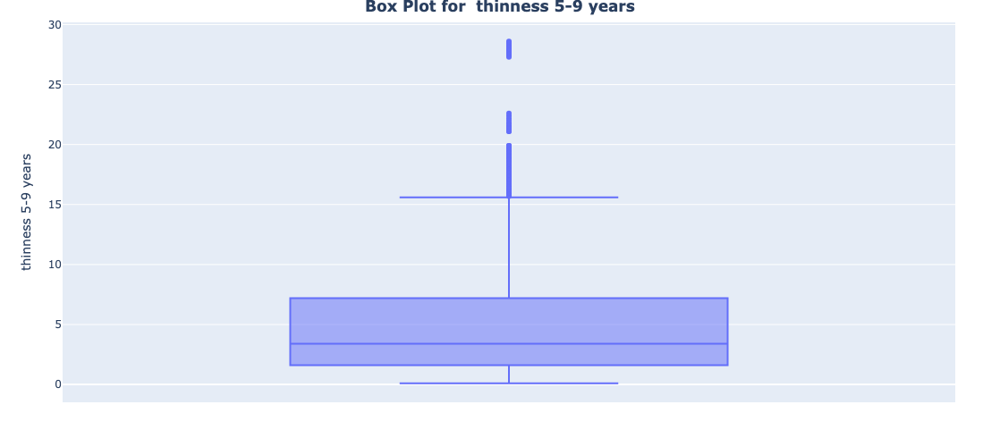

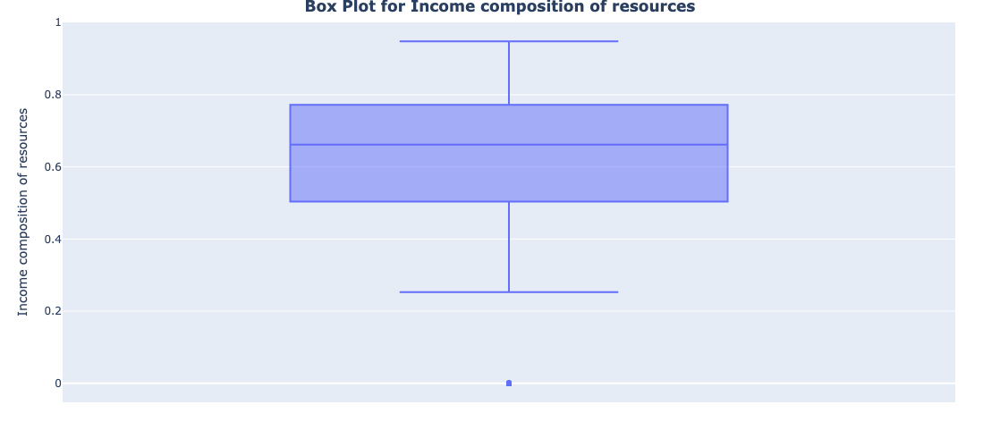

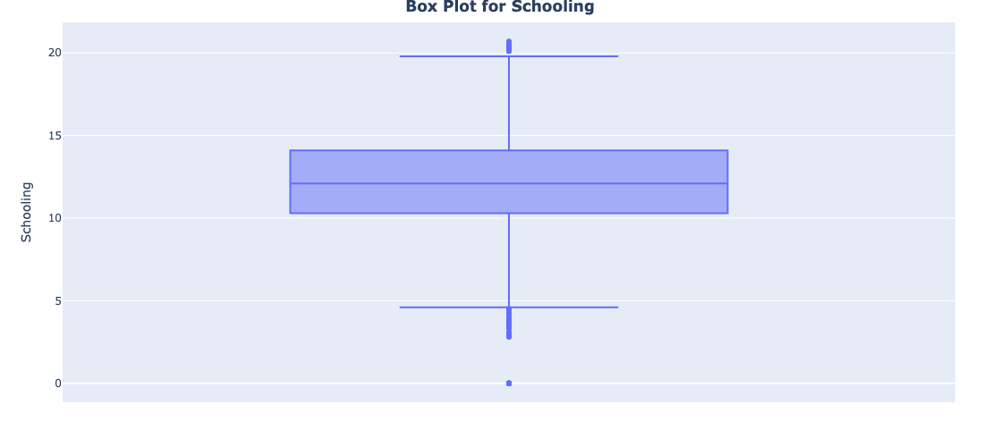

In [10]:
for column in num_cols:
    fig = px.box(df, y=column, title=f'Box Plot for {column}')
    
    # Update layout to center the title and make it bold
    fig.update_layout(
        title=dict(text=f'<b>Box Plot for {column}</b>', x=0.5),
        width=800,  # Adjust the width of the plot
        height=500,  # Adjust the height of the plot
        margin=dict(l=70, r=50, t=25, b=50)  # Adjust margins
    )
    fig.show()

In [ ]:

for col in num_cols:
    
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1

    
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    
    df[col] = np.where((df[col]< lower_bound)| (df[col] > upper_bound),df[col].mean(),df[col])

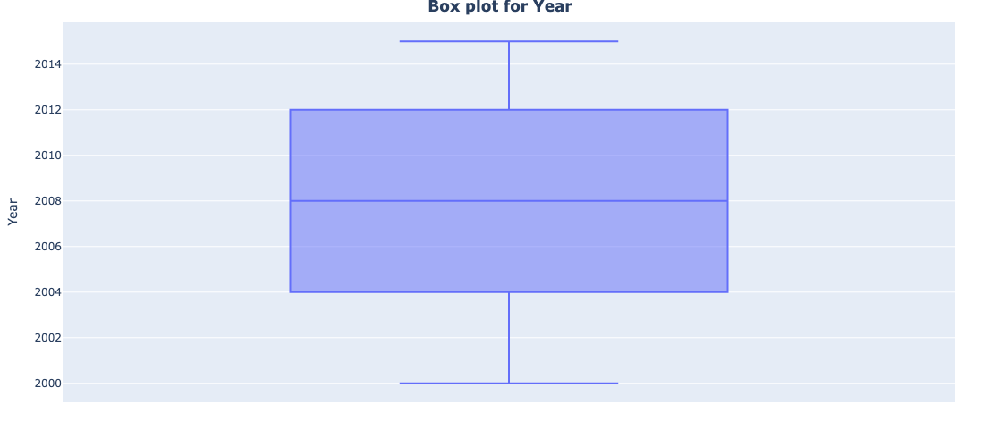

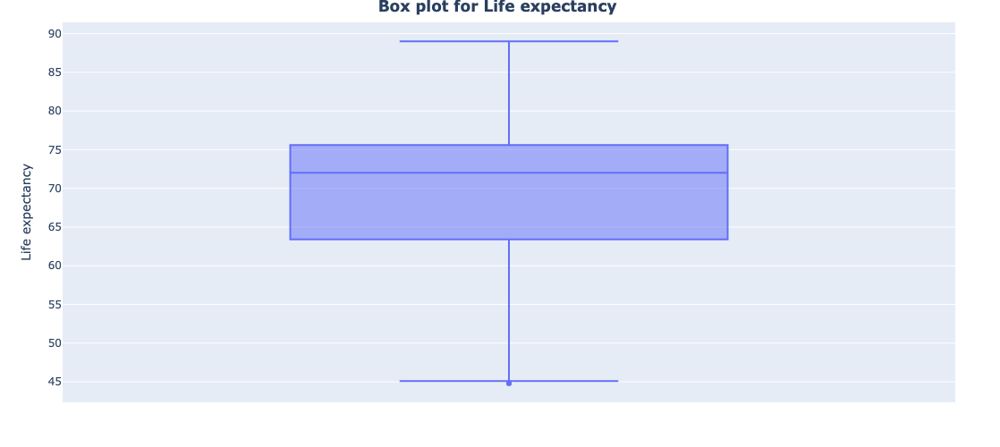

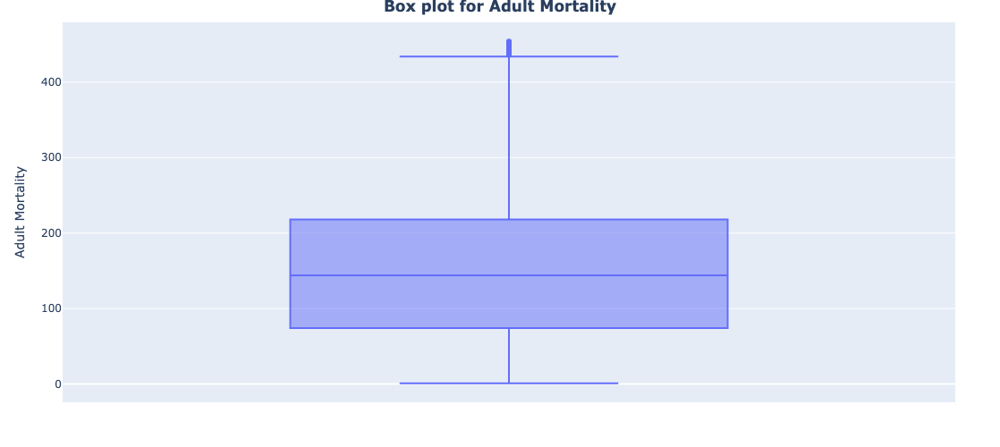

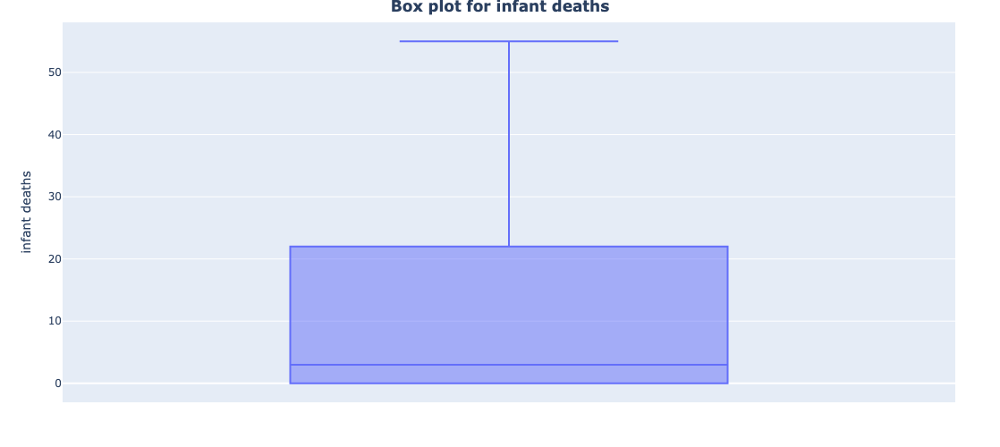

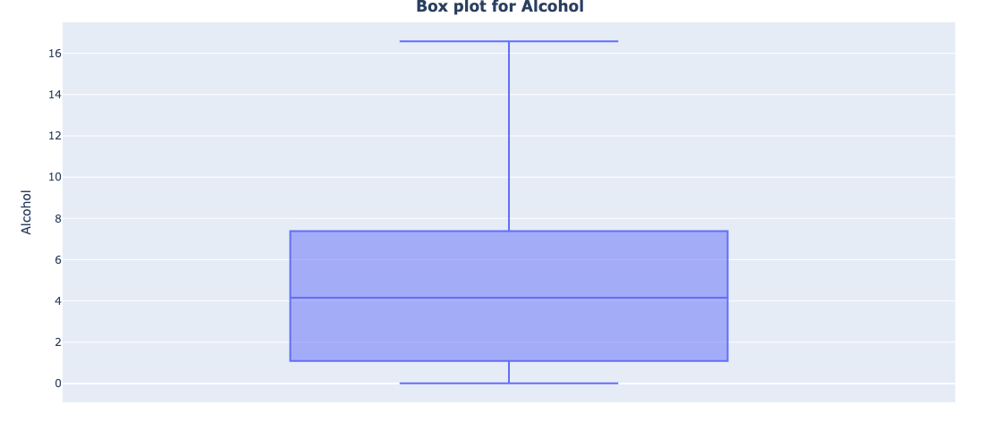

...

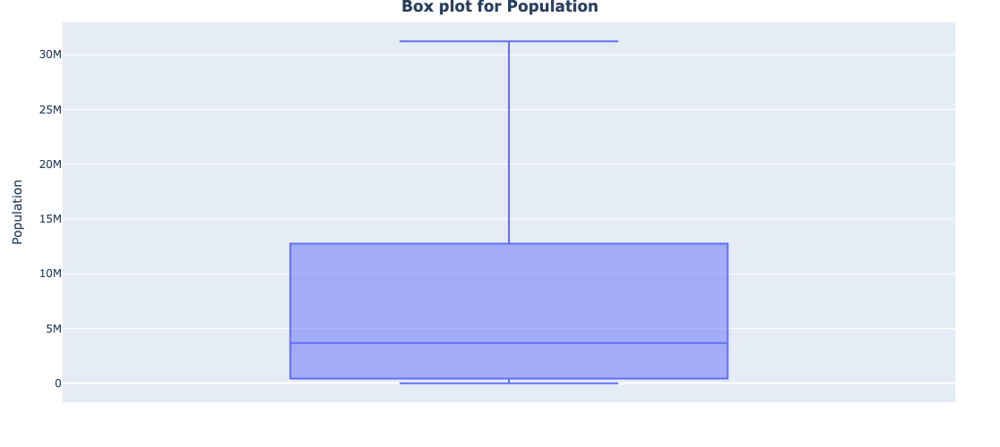

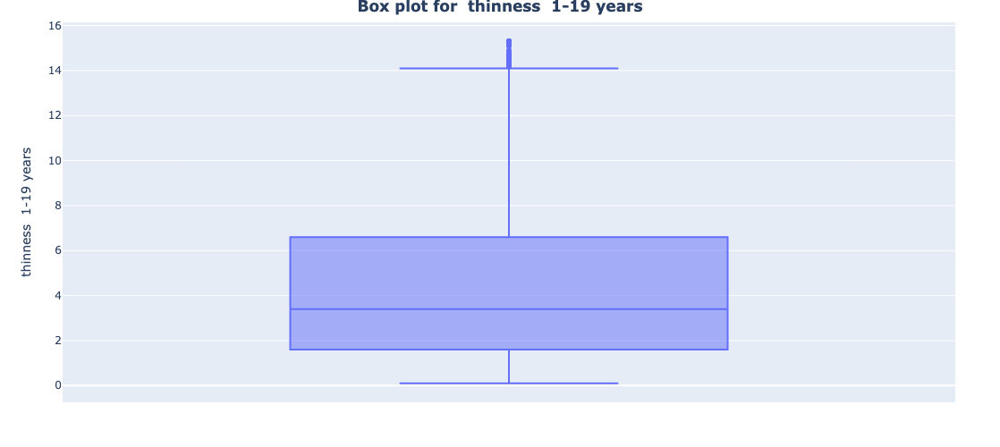

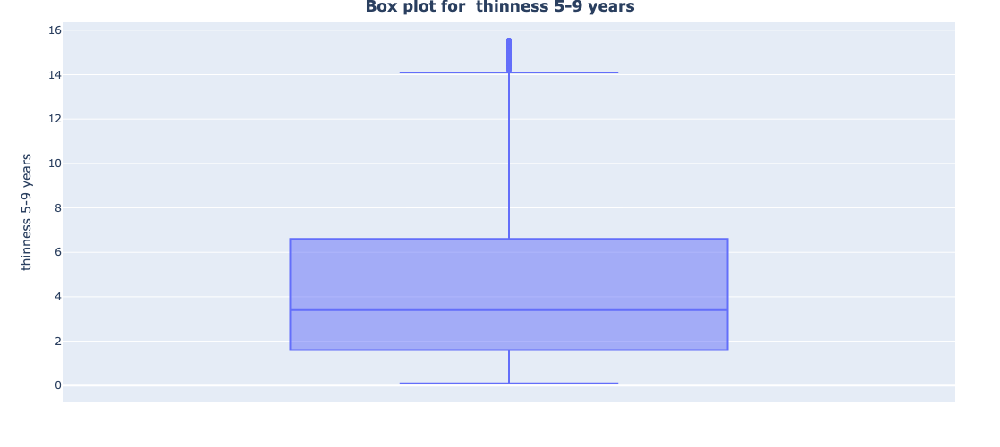

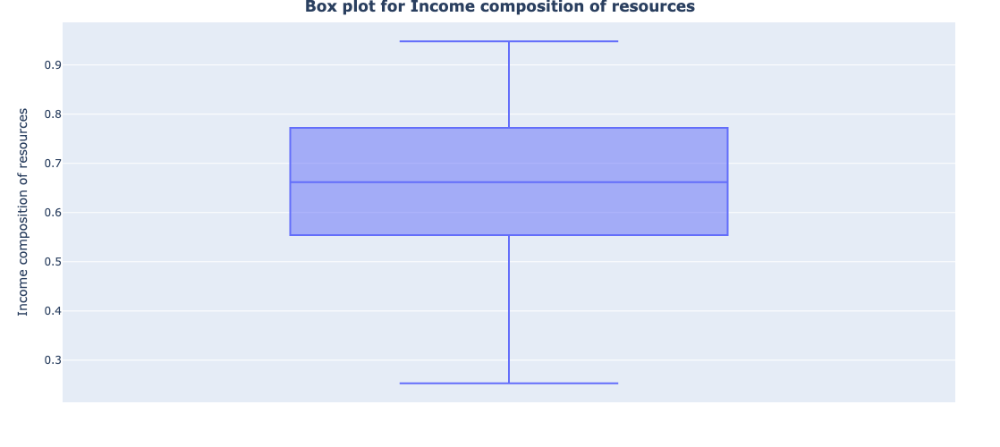

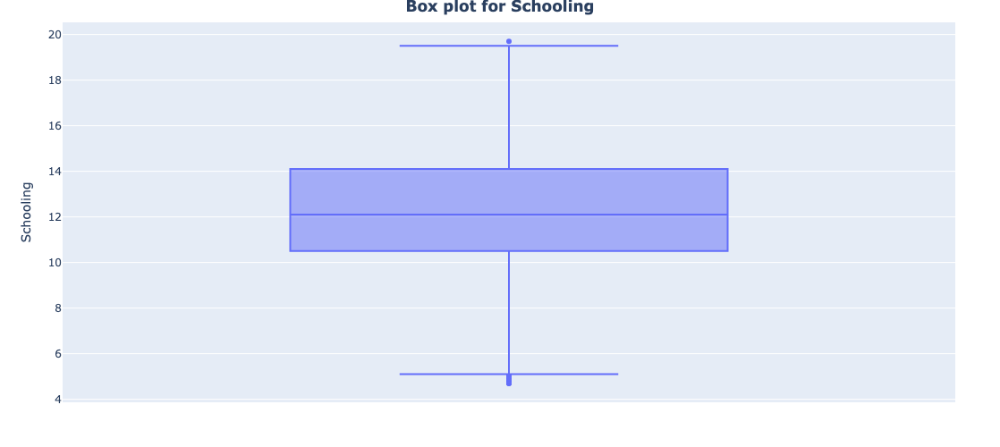

In [12]:
for col in num_cols:
    fig = px.box(df,y=col, title = f'Box plot for {col}')

    fig.update_layout(
        width = 800,
        height = 500,
        margin = dict(l=70,r=50,t=25,b=50),
        title = dict(text= f'<b>Box plot for {col}</b>',x=0.5)
    )
    fig.show()

# Exploration

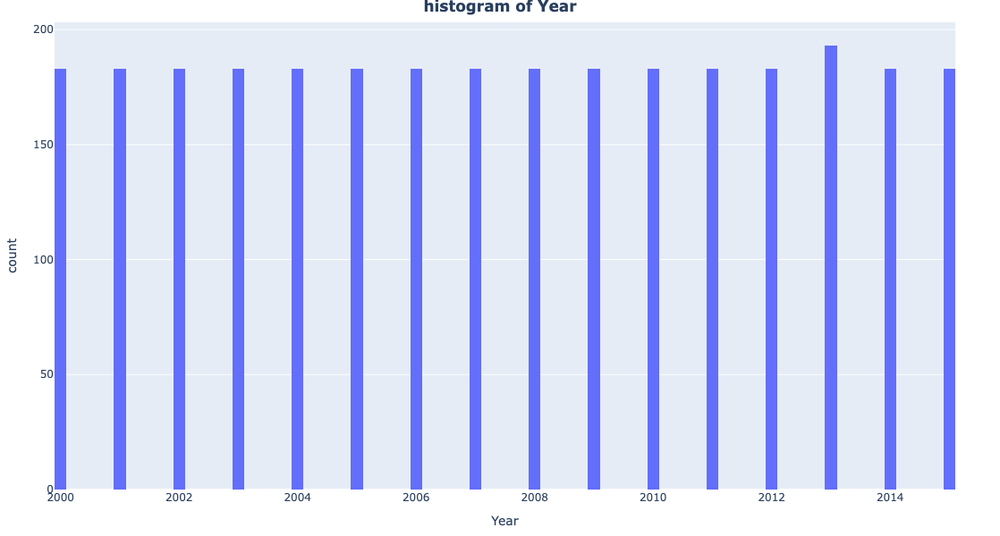

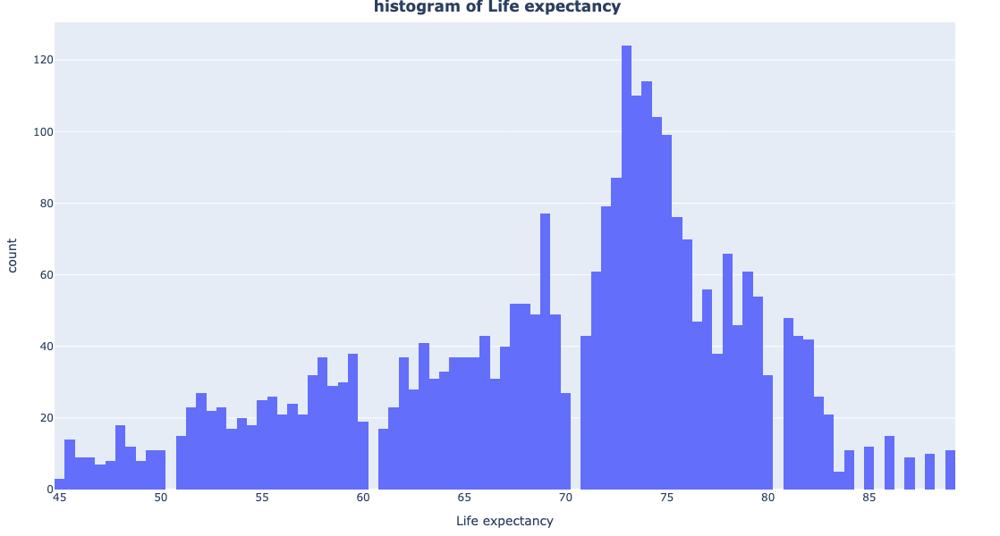

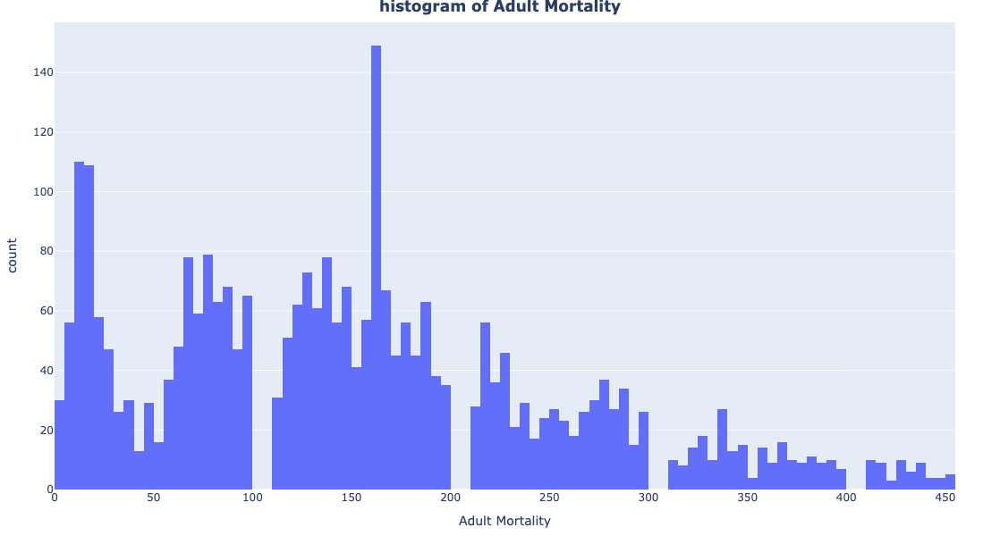

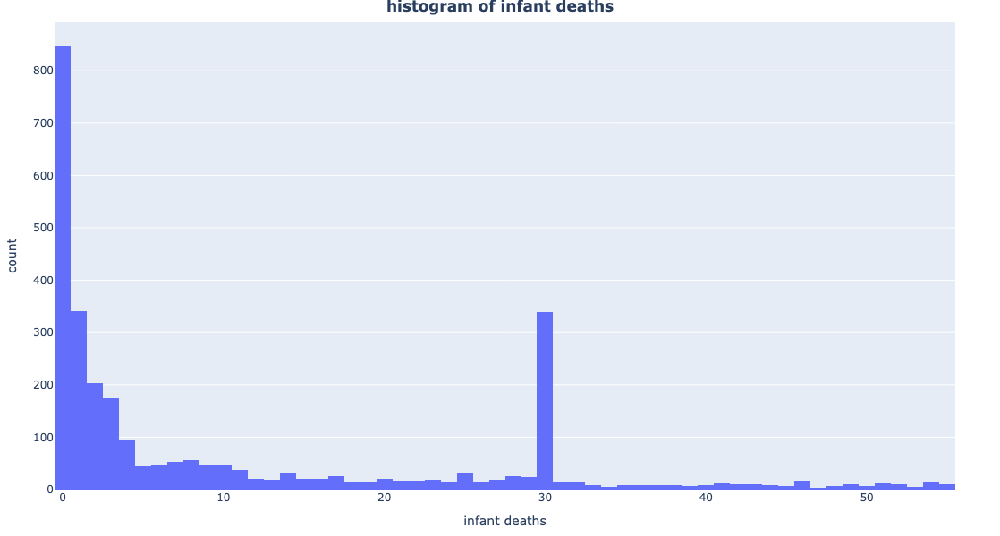

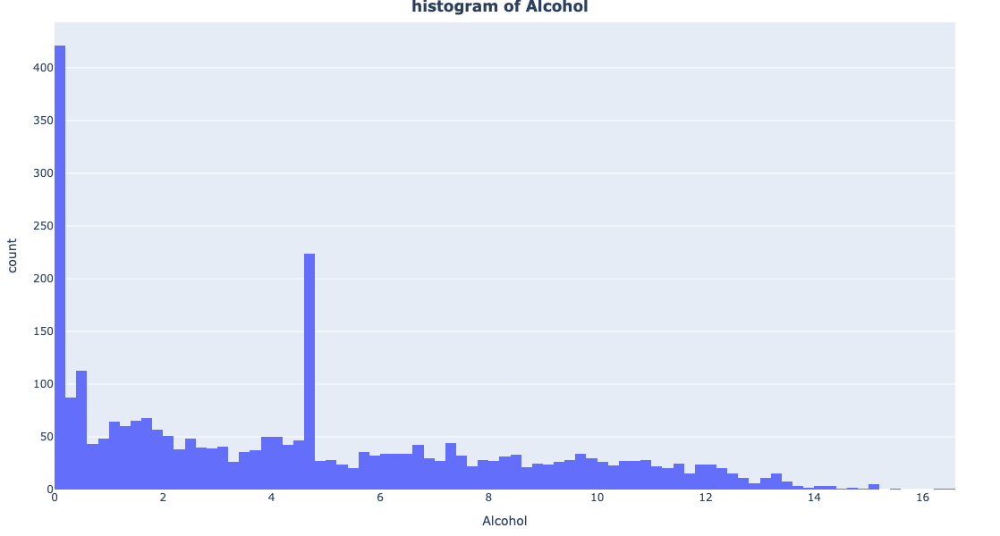

...

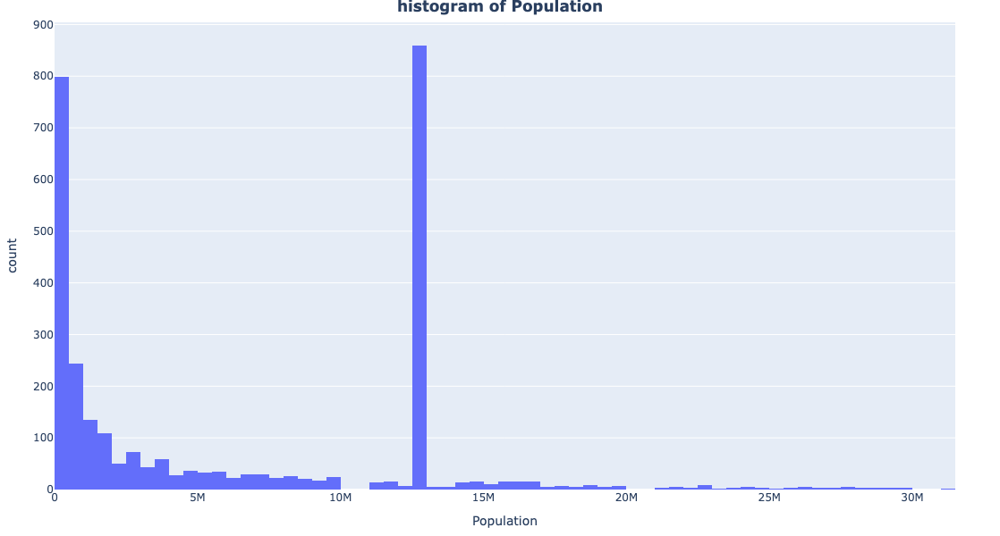

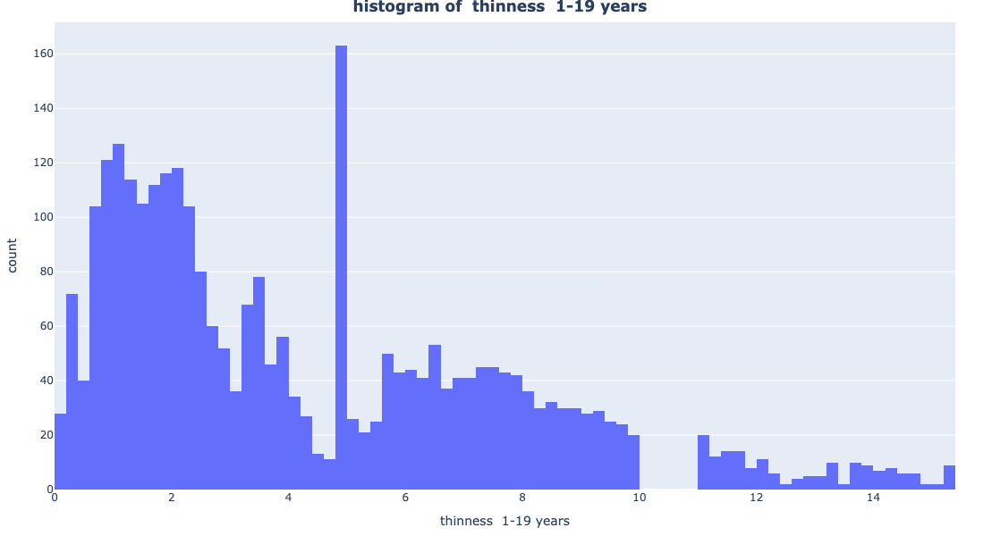

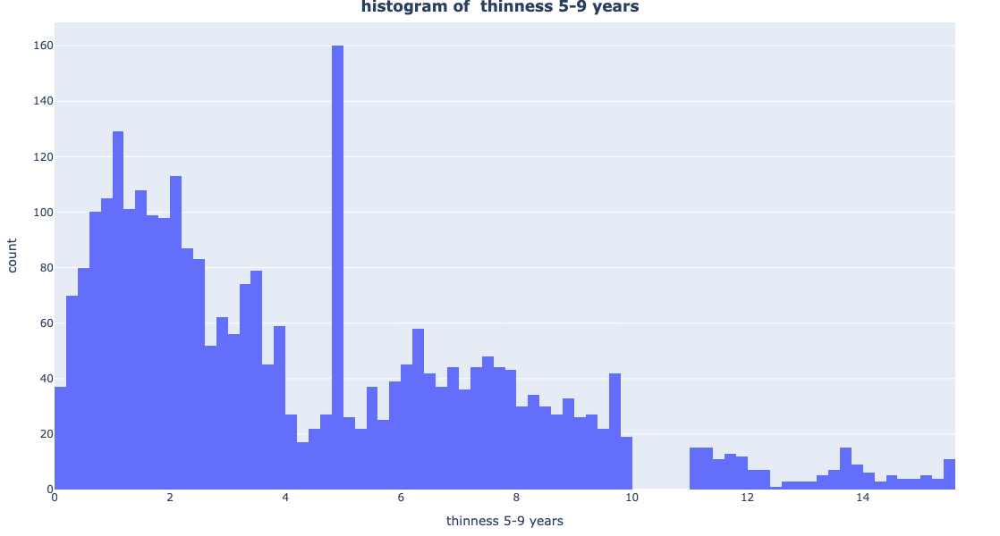

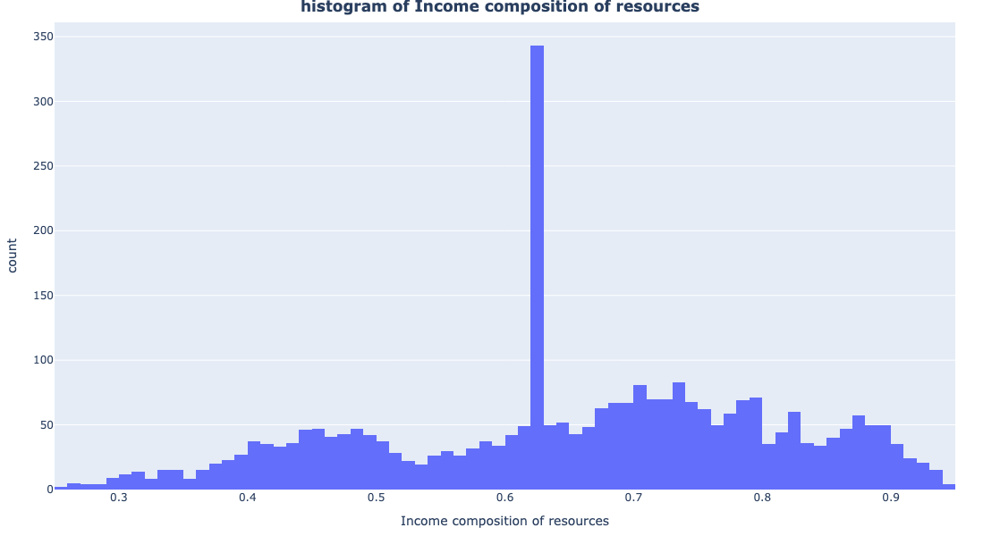

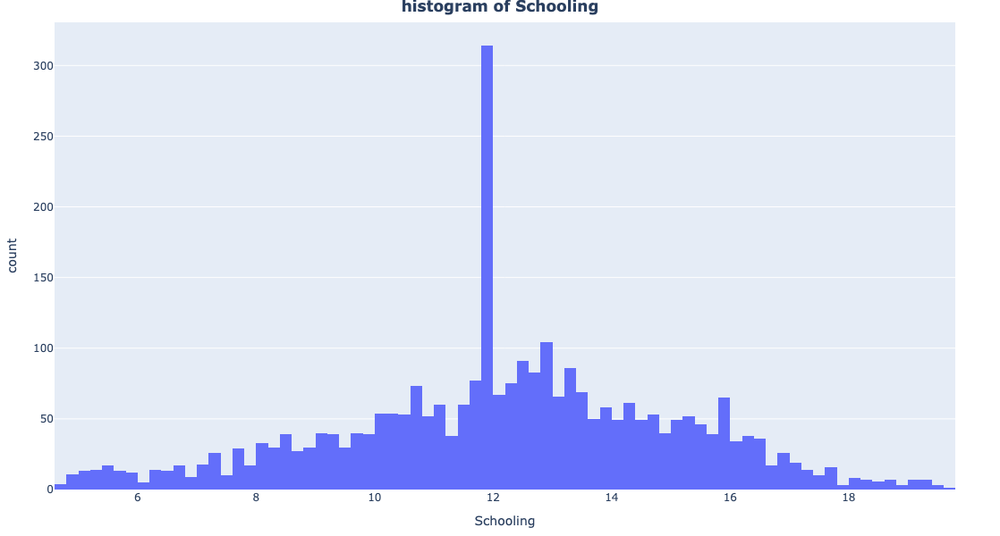

In [ ]:

for col in num_cols:
    fig = px.histogram(df, x= col, title = f'histograme of {col}', nbins = 100)
    fig.update_layout(
        width =800,
        height = 600,
        margin = dict(l = 50, r= 50, t = 25, b = 50),
        title = dict(text = f'<b>histogram of {col}</b>', x= 0.5)
    )
    fig.show()

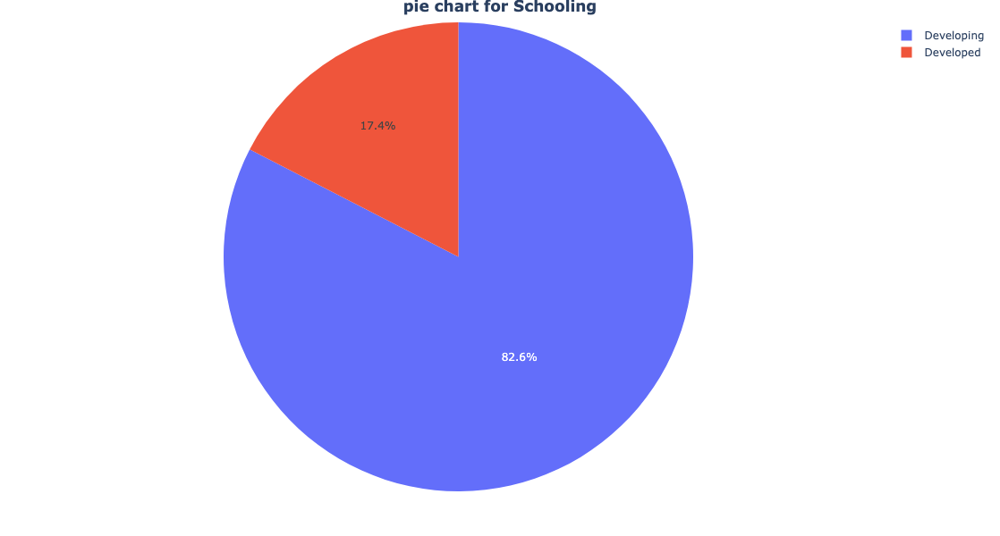

In [ ]:


fig = px.pie(df, names = 'Status', title = 'pie chart for status')
fig.update_layout(
        width = 800,
        height = 600,
        margin = dict(l = 50, r = 50, t = 25, b = 50),
        title = dict(text = f'<b>pie chart for {col}</b>', x = 0.5)
    )
fig.show()

__To dive deeper in this data I'm going to explore the relationship between different categories of the features with the target__
1. __first we will start with socio-economic factors__
2. __then health care access factors__
3. __life style factors__
4. __and finally, mortality disease factors__

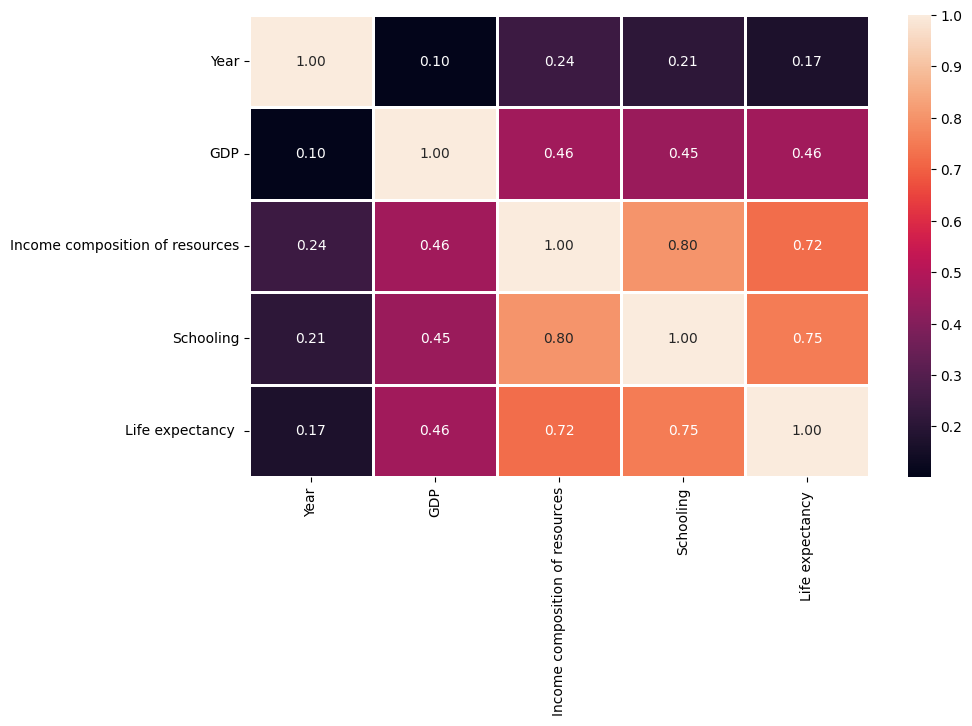

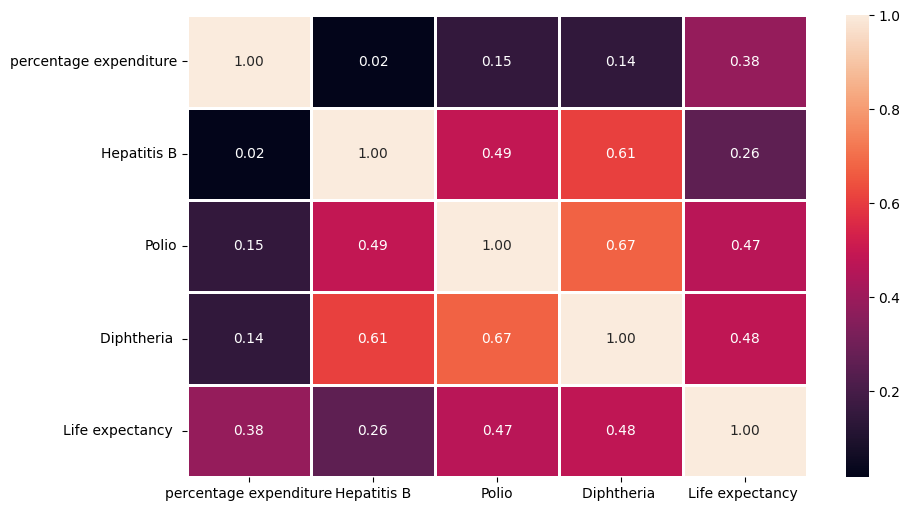

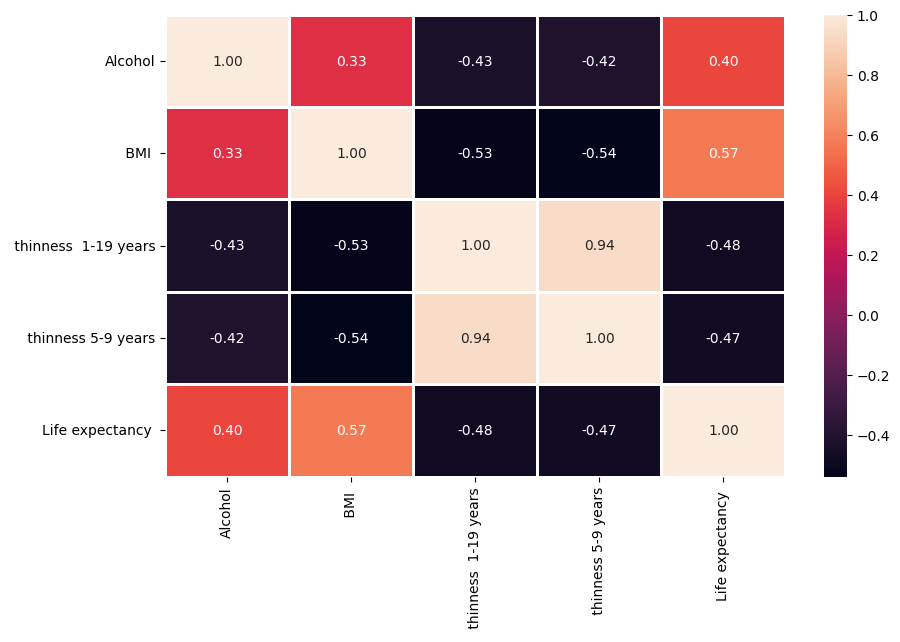

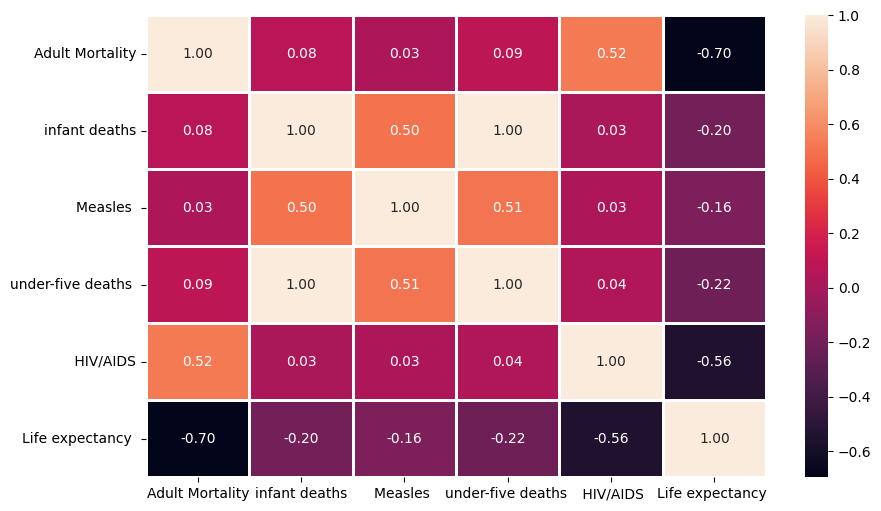

In [15]:
for df_name in dataframes:
    num_col = df_name.select_dtypes(include = ['float64','int64']).columns
    temp_df = df_name[num_col]
    plt.figure(figsize=(10,6))
    sns.heatmap(temp_df.corr(), annot=True, fmt='.2f', linewidths=1)
    plt.show()

<Axes: >

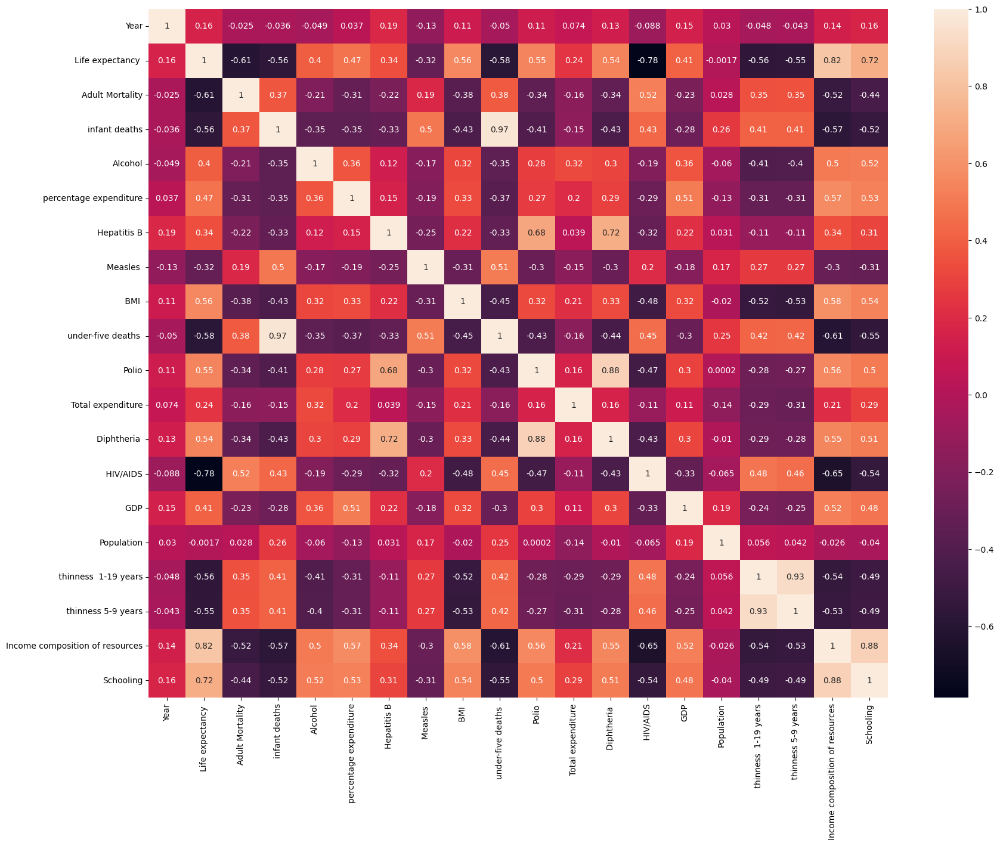

In [16]:
plt.figure(figsize=(20,15))
sns.heatmap(df.drop(['Country','Status'],axis = 1).corr(),annot=True)

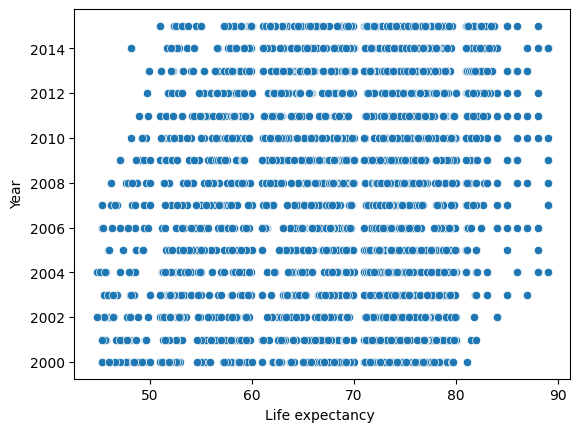

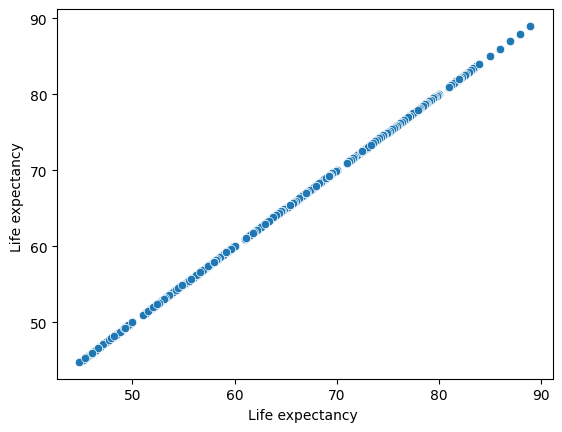

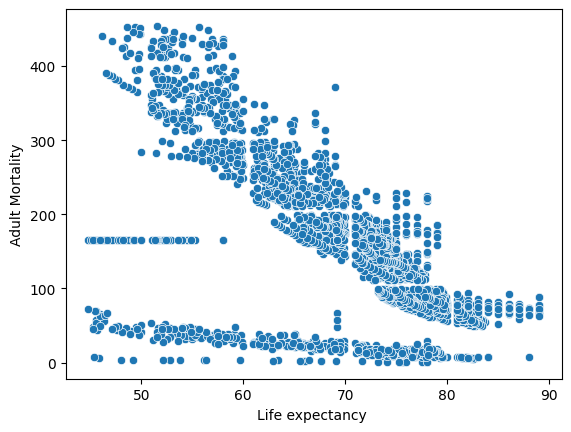

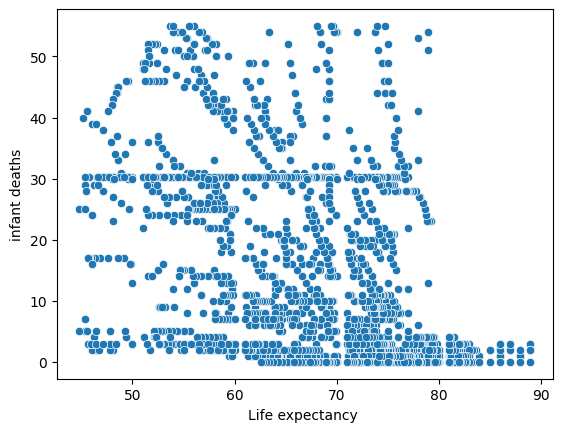

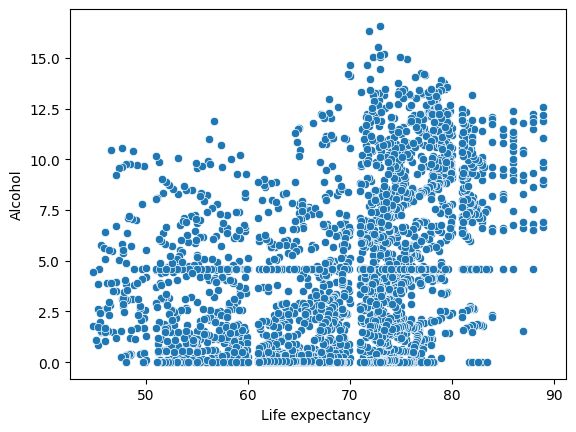

...

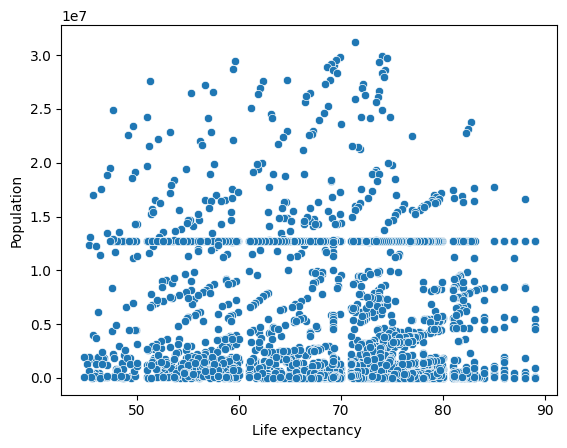

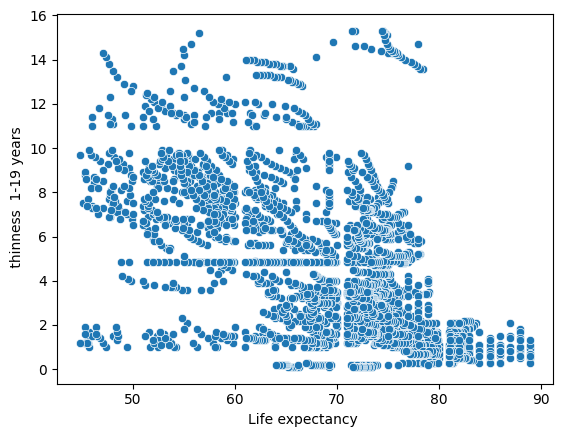

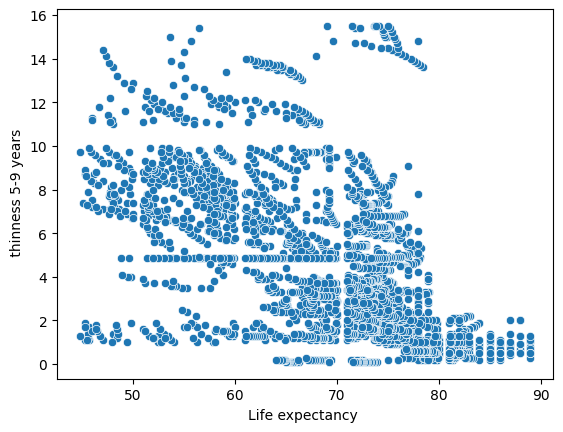

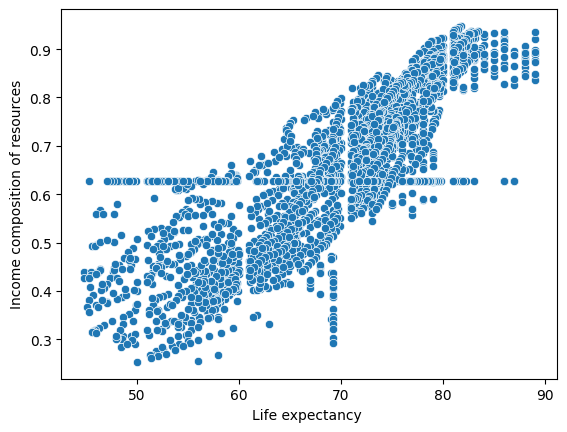

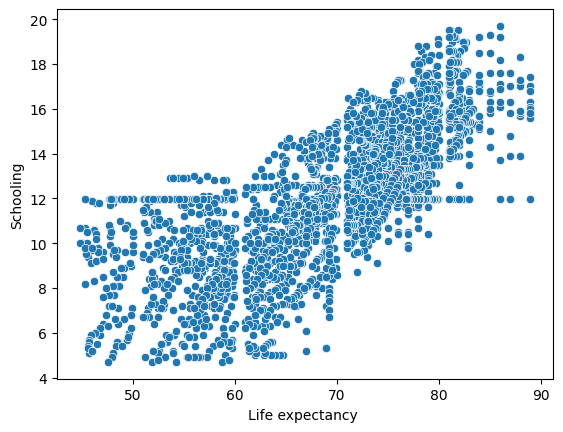

In [ ]:

for col in num_cols:
    sns.scatterplot(df,x='Life expectancy ',y= col)
    plt.title = f'{col} VS Life expectancy'
    plt.show()

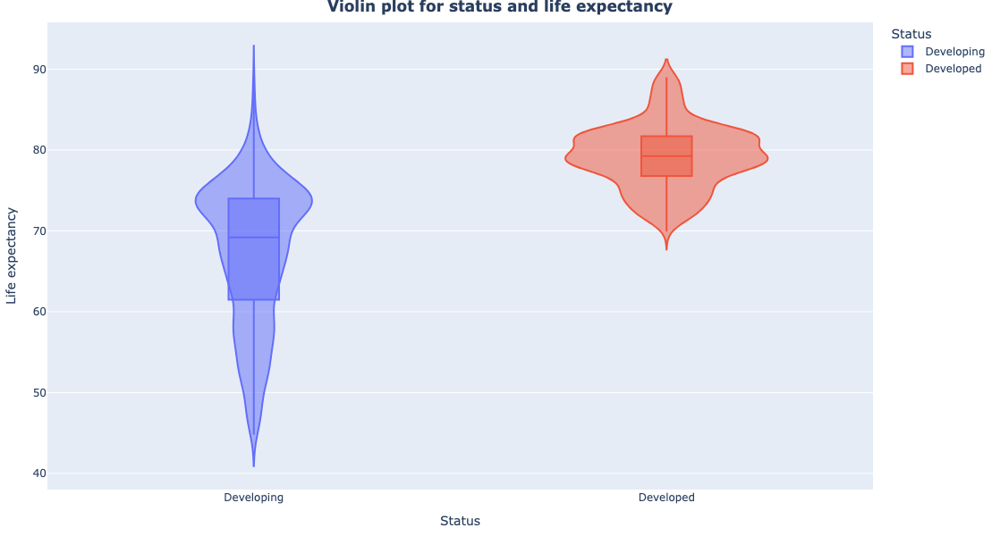

In [18]:
fig = px.violin(df, x = 'Status',y = 'Life expectancy ',box= True,color= 'Status' ,title = 'Violin plot for status and life expectancy')
fig.update_layout(
        width = 800,
        height = 600,
        margin = dict(l = 50, r = 50, t = 25, b = 50),
        title = dict(text = f'<b>Violin plot for status and life expectancy</b>', x = 0.5)
    )
fig.show()

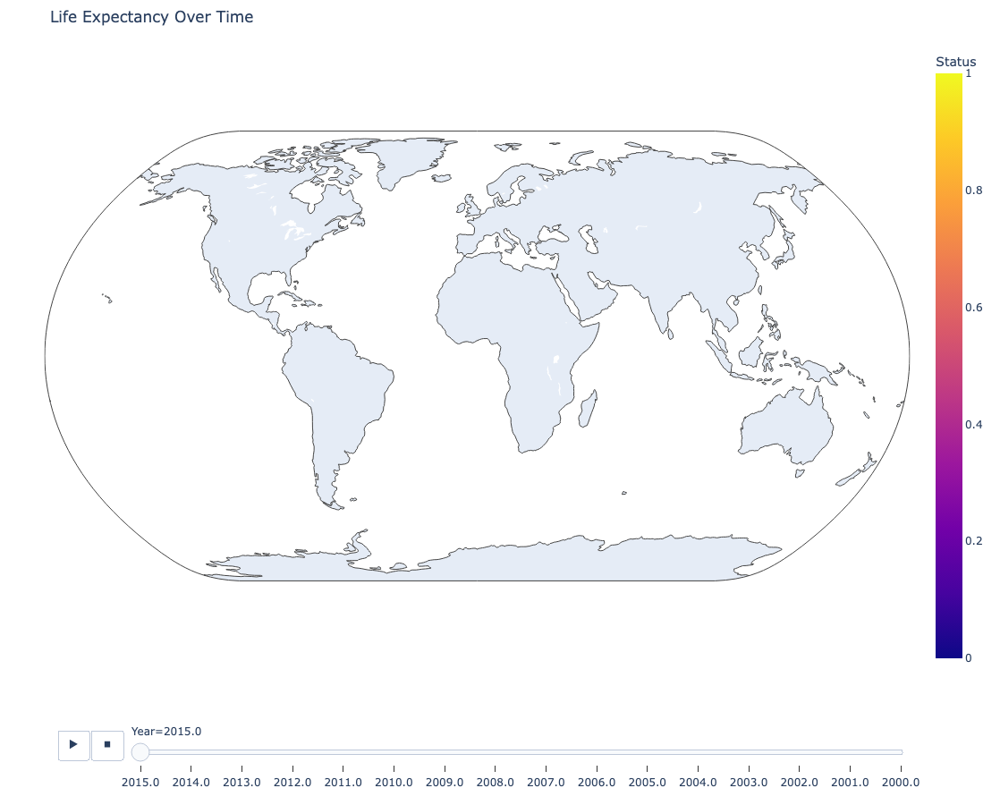

In [ ]:
import plotly.express as px


fig = px.scatter_geo(
    df, 
    locations="Country",  
    locationmode='country names',  
    color="Status",  
    hover_name="Country",  
    size="Life expectancy ", 
    animation_frame="Year", 
    projection="natural earth",
    title="Life Expectancy Over Time"
)

fig.update_layout(
    width=1000,
    height=900,
    margin=dict(l=50, r=50, t=50, b=50)
)

fig.show()

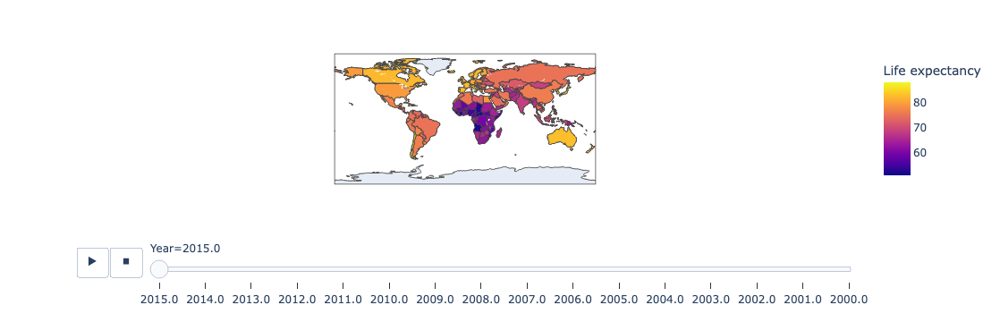

In [21]:
fig11 = px.choropleth(df, locations="Country",locationmode='country names', color="Life expectancy ",hover_name="Country", animation_frame="Year")
fig11.show()

## preperation for training 

In [ ]:


cols_to_encode = ['Country','Status']

Label_ecoder = LabelEncoder()
for col in cols_to_encode:
    df[col] = Label_ecoder.fit_transform(df[col])

df['Status'].unique(), df['Country'].unique()

X = df.drop('Life expectancy ',axis=1)
y = df['Life expectancy ']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.3,random_state = 42)


scaler = MinMaxScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Modeling

## Experiment 1

### Random Forest

In [23]:
from sklearn.ensemble import RandomForestRegressor

rf_model0 = RandomForestRegressor(n_estimators= 100)
rf_model0.fit(X_train,y_train)

RandomForestRegressor()

In [65]:
rf_model0_predictions = rf_model0.predict(X_test)

In [66]:
def adjusted_r2(X,y_true,y_pred):
    r2 = r2_score(y_true,y_pred)
    n = X.shape[0]
    p = X.shape[1]
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

In [67]:
print('mae for rf model 0 :',mean_absolute_error(y_test,rf_model0_predictions))
print('mse for rf model 0 :',mean_squared_error(y_test,rf_model0_predictions))
print('rmse for rf model 0 :',root_mean_squared_error(y_test,rf_model0_predictions))
print('r2_score for rf model 0 :',r2_score(y_test,rf_model0_predictions))
print('adjusted r2_score for rf model 0 :',adjusted_r2(X_test,y_test,rf_model0_predictions))

mae for rf model 0 : 1.2593335579222582
mse for rf model 0 : 5.173247887657119
rmse for rf model 0 : 2.274477497724943
r2_score for rf model 0 : 0.9411999282903111
adjusted r2_score for rf model 0 : 0.9397641125857722


In [68]:
rf_feature_importances = pd.DataFrame(data=rf_model0.feature_importances_,index=X.columns,columns=['importance'])
rf_feature_importances.sort_values(by='importance',ascending=False,inplace = True)


In [69]:
rf_feature_importances

,importance
HIV/AIDS,0.570736
Income composition of resources,0.157623
Adult Mortality,0.126525
Schooling,0.027213
BMI,0.017972
under-five deaths,0.014006
thinness 5-9 years,0.011059
Year,0.009742
Alcohol,0.009680
Total expenditure,0.008783


### Artifical Neural network

In [70]:
from tensorflow.keras.callbacks import EarlyStopping

In [71]:
ann_model0 = Sequential([
        Dense(64, activation='relu', input_dim=21),
        Dense(64, activation='relu'),
        Dense(64, activation='relu'),
        Dense(1, activation='linear')
])

ann_model0.compile(optimizer='adam',loss='mean_absolute_error',metrics =['mse'])
Early_stopping = EarlyStopping(monitor = 'val_loss', patience = 10,restore_best_weights = True)
history = ann_model0.fit(X_train,y_train,epochs = 400,validation_data=(X_test,y_test),callbacks = [Early_stopping])

Epoch 1/400
65/65 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 66.0509 - mse: 4500.4980 - val_loss: 9.9496 - val_mse: 159.4730
Epoch 2/400
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 10.3216 - mse: 183.6470 - val_loss: 6.6471 - val_mse: 68.2850
Epoch 3/400
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 6.7469 - mse: 70.8604 - val_loss: 6.0227 - val_mse: 56.4630
Epoch 4/400
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 6.1962 - mse: 61.7766 - val_loss: 5.2839 - val_mse: 44.9027
Epoch 5/400
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 5.4823 - mse: 49.3188 - val_loss: 4.8045 - val_mse: 37.1745
Epoch 6/400
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.8944 - mse: 39.2378 - val_loss: 4.2256 - val_mse: 29.9225
Epoch 7/400
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 4.0677 - mse: 27.7545 - val_loss: 3.9442 - val_mse: 26.7734
Epoch 8/400
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 3.8473 - mse: 25.8766 - val_loss: 3.4289 - val_mse: 22.0641
Epoch 9/400
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 

In [72]:
training_frame = pd.DataFrame(history.history)

In [73]:
training_frame

,loss,mse,val_loss,val_mse
0,56.529198,3538.317139,9.949571,159.473007
1,8.959057,136.055130,6.647052,68.284996
2,6.540308,67.057564,6.022696,56.463032
3,5.910124,55.801373,5.283857,44.902729
4,5.285081,45.453896,4.804481,37.174534
...,...,...,...,...
90,2.420782,12.275608,2.473808,13.223043
91,2.328565,11.878338,2.468222,13.195762
92,2.313395,11.771021,2.473191,13.180066
93,2.308871,11.729755,2.485670,13.167912


In [ ]:

import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Scatter(x=training_frame.index, y=training_frame['loss'], mode='lines', name='Training loss'))
fig.add_trace(go.Scatter(x=training_frame.index, y=training_frame['val_loss'], mode='lines', name='Validation loss'))
fig.update_layout(
    title=dict(text = '<b>Training Loss vs Validation Loss</b>',x = 0.5),
    xaxis_title='Epochs',
    yaxis_title='Loss',
    width=800,
    height=600
)

fig.show()

In [75]:
predictions_ann_model0 = ann_model0.predict(X_test)

28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


In [76]:
print('mae for ann model 0 :',mean_absolute_error(y_test,predictions_ann_model0))
print('mse for ann model 0 :',mean_squared_error(y_test,predictions_ann_model0))
print('rmse for ann model 0 :',root_mean_squared_error(y_test,predictions_ann_model0))
print('r2_score for ann model 0 :',r2_score(y_test,predictions_ann_model0))
print('adjusted r2_score for ann model 0 :',adjusted_r2(X_test,y_test,predictions_ann_model0))

mae for ann model 0 : 2.447632460829751
mse for ann model 0 : 13.108996478580687
rmse for ann model 0 : 3.620634817070162
r2_score for ann model 0 : 0.8510007736490486
adjusted r2_score for ann model 0 : 0.8473624204474556


# Interpreting and informing

In [77]:
Ann_explainer = shap.DeepExplainer(ann_model0, X_train)
shap_explainer = Ann_explainer(X_test)

In [ ]:

shap_explainer.values.shape

(882, 21, 1)

In [79]:
shap_values_Ann = shap_explainer.values.squeeze()

In [80]:
shap_values_Ann.mean(axis=1).shape

(882,)

In [81]:
shap_values_Ann.shape
shap_values_df = pd.DataFrame(shap_values_Ann, columns=X.columns)
shap_values_mean = shap_values_df.abs().mean()

In [82]:
shap_values_mean.sort_values(ascending=False,inplace=True)
shap_values_mean

Income composition of resources    3.357043
 HIV/AIDS                          2.582656
Adult Mortality                    1.053991
 thinness 5-9 years                0.897185
GDP                                0.800144
Status                             0.626214
under-five deaths                  0.603891
Alcohol                            0.588834
percentage expenditure             0.501589
Diphtheria                         0.475404
Year                               0.460225
infant deaths                      0.389157
Polio                              0.388486
Measles                            0.380036
 thinness  1-19 years              0.337886
Population                         0.321110
Total expenditure                  0.256619
Country                            0.227345
Schooling                          0.221606
 BMI                               0.206307
Hepatitis B                        0.196579
dtype: float64

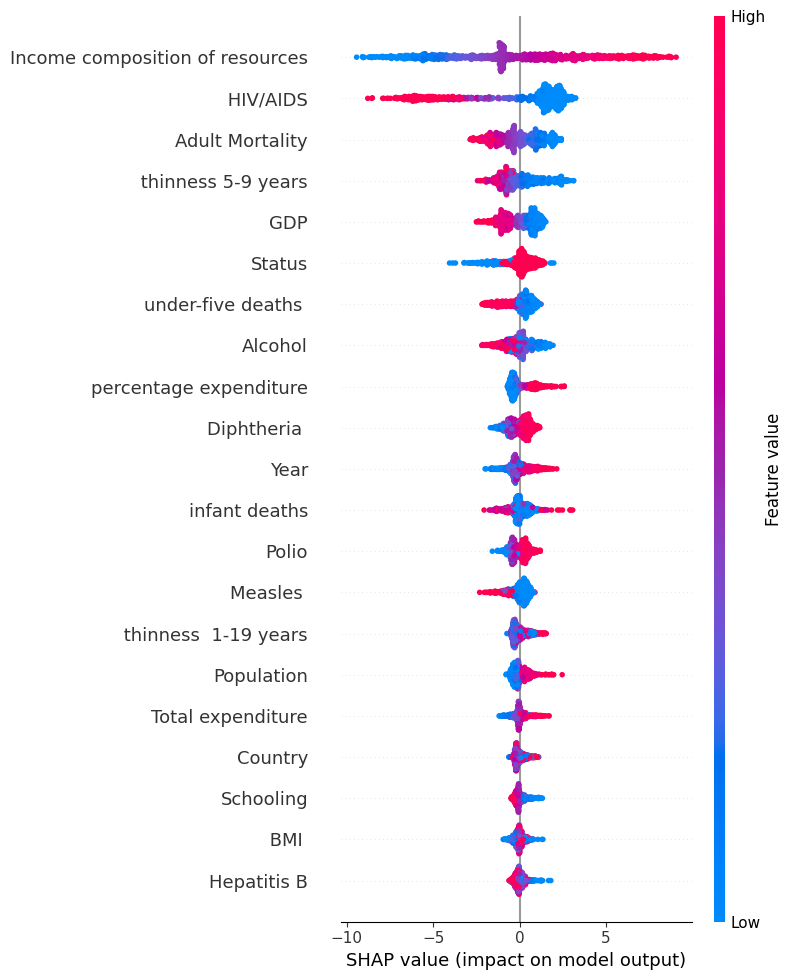

<Figure size 640x480 with 0 Axes>

In [83]:
shap.summary_plot(shap_values_Ann,X_test, max_display=21,feature_names= X.columns )
plt.savefig('shap_summary_plot_ann_model0.png')

In [84]:
shap.initjs()

In [85]:
shap.force_plot(Ann_explainer.expected_value[0].numpy(), shap_explainer[4].values.squeeze(),X_test[4] ,feature_names = X.columns)


# Confidence Interval

In [33]:
y_test = np.array(y_test)

In [57]:
def confidence_interval(x_test, y_test,bootstraps = 1000, confidence = 0.95, method = 'percentiles'):
    from scipy.stats import norm
    metrices = []
    
    for i in range(bootstraps):
        indices = np.random.choice(x_test.shape[0],x_test.shape[0], replace = True)
        
        x_samples, y_samples = x_test[indices] , y_test[indices]
        
        predictions = rf_model0.predict(x_samples)
        
        metrices.append(mean_absolute_error(y_samples,predictions))
    if method == "percentiles":

        lower_bound = np.percentile(metrices, (1 - confidence)/2 * 100)
        upper_bound = np.percentile(metrices, (1 - ((1-confidence)/2) ) * 100 )

        mean_metrices = np.mean(metrices)
    if method == "z-score":
        z_score = norm.ppf(confidence)
        
        SE = np.std(metrices, ddof = 1)/ np.sqrt(bootstraps)

        margin = z_score * SE

        mean_metrices = np.mean(metrices)

        lower_bound = mean_metrices - margin
        upper_bound = mean_metrices + margin


    return mean_metrices, lower_bound, upper_bound, metrices


mean_metrices, l1, l3, metrices = confidence_interval(X_test, y_test, method = "z-score")


In [58]:
print(f'mean of metrices: {mean_metrices}')

mean of metrices: 1.2737084967558512


In [59]:
print(f'lower bound of the metrices: {l1}')

lower bound of the metrices: 1.2703684741693853


In [60]:
print(f'upper bound of the metrices: {l3}')

upper bound of the metrices: 1.2770485193423171


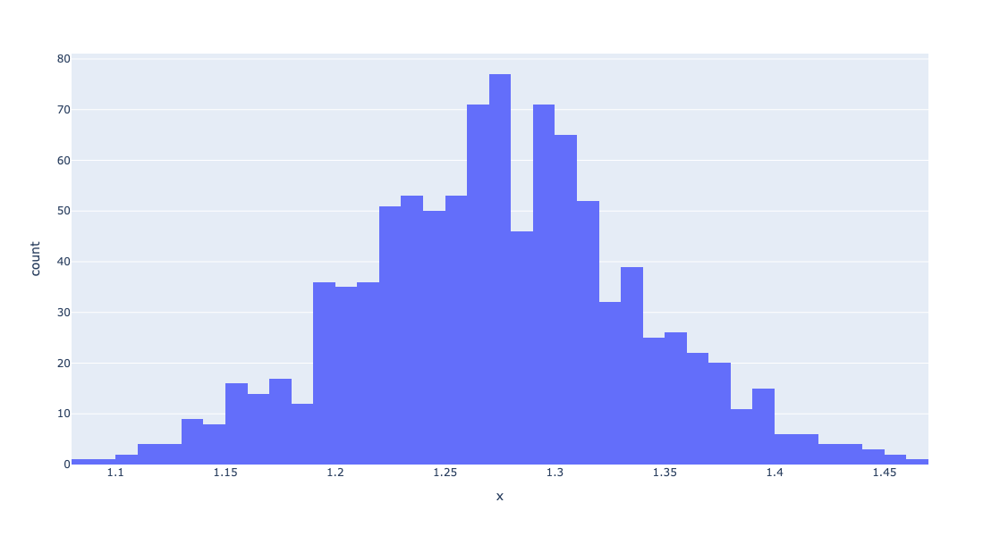

In [70]:
fig = px.histogram(x = metrices, labels='distribution of metrices',nbins = 50)
fig.update_layout(
    width = 700,
    height = 600
)
fig.show()